In [1]:
import os
import sys
import datetime
import random
from typing import List

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas_profiling


In [2]:
random.seed(0)
%matplotlib inline
sys.path.append('../utils/')

In [3]:
from content_based_recomender import ContentBasedRecommender
from baseline_last_sold_recommender import LastSoldRecommender
from baseline_most_sold_recommender import MostSoldRecommender

# Load data

In [4]:
for dirname, _, filenames in os.walk('./../data'):
    for filename in filenames:
        print(os.path.join(dirname, filename))


./../data/Customer.csv
./../data/prod_cat_info.csv
./../data/Transactions.csv


In [5]:
customer_raw_df = pd.read_csv('./../data/Customer.csv')
prod_cat_info_raw_df = pd.read_csv('./../data/prod_cat_info.csv')
transactions_raw_df = pd.read_csv('./../data/Transactions.csv')


# Customer info

In [6]:
print(customer_raw_df.shape)
customer_raw_df.head()

(5647, 4)


,customer_Id,DOB,Gender,city_code
0,268408,02-01-1970,M,4.0
1,269696,07-01-1970,F,8.0
2,268159,08-01-1970,F,8.0
3,270181,10-01-1970,F,2.0
4,268073,11-01-1970,M,1.0


In [7]:
customer_raw_df.nunique()

customer_Id    5647
DOB            4056
Gender            2
city_code        10
dtype: int64

5647 unique customer, from 10 different cities

In [8]:
pandas_profiling.ProfileReport(customer_raw_df)

**Distribution des codes de villes**
<img src="./imgs/img_0.png">

**Distribution des sexes**
<img src="./imgs/img_2.png">

Les codes de villes sont uniformement distribué, le sexe aussi.


In [9]:
customer_raw_df.isnull().sum()

customer_Id    0
DOB            0
Gender         2
city_code      2
dtype: int64

In [10]:
customer_raw_df[customer_raw_df.Gender.isnull()]

,customer_Id,DOB,Gender,city_code
24,267199,14-02-1970,NaN,2.0
87,271626,02-06-1970,NaN,6.0


In [11]:
customer_raw_df[customer_raw_df.city_code.isnull()]

,customer_Id,DOB,Gender,city_code
115,268447,14-07-1970,M,NaN
149,268709,09-09-1970,F,NaN


Deux valeurs nulles pour "gender" et "city code"

In [12]:
customer_raw_df['age_at_start_of_recods'] = (pd.to_datetime('01-01-2011', format='%d-%m-%Y') - pd.to_datetime(customer_raw_df.DOB, format='%d-%m-%Y')).map(lambda x: x.days)//365
customer_raw_df

,customer_Id,DOB,Gender,city_code,age_at_start_of_recods
0,268408,02-01-1970,M,4.0,41
1,269696,07-01-1970,F,8.0,41
2,268159,08-01-1970,F,8.0,41
3,270181,10-01-1970,F,2.0,41
4,268073,11-01-1970,M,1.0,41
...,...,...,...,...,...
5642,274474,19-12-1992,M,2.0,18
5643,267666,24-12-1992,M,6.0,18
5644,270476,25-12-1992,F,3.0,18
5645,269626,27-12-1992,F,5.0,18


In [13]:
customer_raw_df.age_at_start_of_recods.describe()

count    5647.000000
mean       28.961573
std         6.619199
min        18.000000
25%        23.000000
50%        29.000000
75%        35.000000
max        41.000000
Name: age_at_start_of_recods, dtype: float64

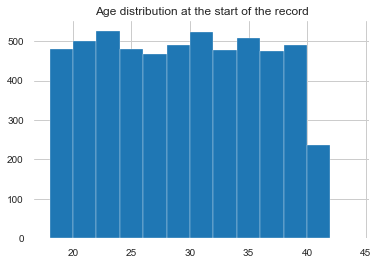

In [14]:
customer_raw_df.age_at_start_of_recods.hist(bins=[18+i*2 for i in range(25) if 18+i*2<45])
plt.title('Age distribution at the start of the record')
plt.show()

L'age aussi est uniformement distribué

# Product category

In [15]:
print(prod_cat_info_raw_df.shape)
prod_cat_info_raw_df

(23, 4)


,prod_cat_code,prod_cat,prod_sub_cat_code,prod_subcat
0,1,Clothing,4,Mens
1,1,Clothing,1,Women
2,1,Clothing,3,Kids
3,2,Footwear,1,Mens
4,2,Footwear,3,Women
5,2,Footwear,4,Kids
6,3,Electronics,4,Mobiles
7,3,Electronics,5,Computers
8,3,Electronics,8,Personal Appliances
9,3,Electronics,9,Cameras


In [16]:
prod_cat_info_raw_df.nunique()

prod_cat_code         6
prod_cat              6
prod_sub_cat_code    12
prod_subcat          18
dtype: int64

23 unique combinaisons de catégoried et sous-catégories

In [17]:
pandas_profiling.ProfileReport(prod_cat_info_raw_df)

In [18]:
prod_cat_info_raw_df

,prod_cat_code,prod_cat,prod_sub_cat_code,prod_subcat
0,1,Clothing,4,Mens
1,1,Clothing,1,Women
2,1,Clothing,3,Kids
3,2,Footwear,1,Mens
4,2,Footwear,3,Women
5,2,Footwear,4,Kids
6,3,Electronics,4,Mobiles
7,3,Electronics,5,Computers
8,3,Electronics,8,Personal Appliances
9,3,Electronics,9,Cameras


Remarque: les sous-catégories n'ont pas les même code au sein de chaque catégorie
La sous-catégorie "Mens" est de code 4 dans la catégorie "Clothing" et de code 1 dans la catégorie "Footwear"

# Transactions info

In [19]:
transactions_raw_df

,transaction_id,cust_id,tran_date,prod_subcat_code,prod_cat_code,Qty,Rate,Tax,total_amt,Store_type
0,80712190438,270351,28-02-2014,1,1,-5,-772,405.300,-4265.300,e-Shop
1,29258453508,270384,27-02-2014,5,3,-5,-1497,785.925,-8270.925,e-Shop
2,51750724947,273420,24-02-2014,6,5,-2,-791,166.110,-1748.110,TeleShop
3,93274880719,271509,24-02-2014,11,6,-3,-1363,429.345,-4518.345,e-Shop
4,51750724947,273420,23-02-2014,6,5,-2,-791,166.110,-1748.110,TeleShop
...,...,...,...,...,...,...,...,...,...,...
23048,94340757522,274550,25-01-2011,12,5,1,1264,132.720,1396.720,e-Shop
23049,89780862956,270022,25-01-2011,4,1,1,677,71.085,748.085,e-Shop
23050,85115299378,271020,25-01-2011,2,6,4,1052,441.840,4649.840,MBR
23051,72870271171,270911,25-01-2011,11,5,3,1142,359.730,3785.730,TeleShop


In [20]:
print(transactions_raw_df.shape)
transactions_raw_df['tran_date'] = pd.to_datetime(transactions_raw_df['tran_date'].str.replace('/','-'), format='%d-%m-%Y')
transactions_raw_df.head()

(23053, 10)


,transaction_id,cust_id,tran_date,prod_subcat_code,prod_cat_code,Qty,Rate,Tax,total_amt,Store_type
0,80712190438,270351,2014-02-28,1,1,-5,-772,405.300,-4265.300,e-Shop
1,29258453508,270384,2014-02-27,5,3,-5,-1497,785.925,-8270.925,e-Shop
2,51750724947,273420,2014-02-24,6,5,-2,-791,166.110,-1748.110,TeleShop
3,93274880719,271509,2014-02-24,11,6,-3,-1363,429.345,-4518.345,e-Shop
4,51750724947,273420,2014-02-23,6,5,-2,-791,166.110,-1748.110,TeleShop


In [21]:
transactions_raw_df

,transaction_id,cust_id,tran_date,prod_subcat_code,prod_cat_code,Qty,Rate,Tax,total_amt,Store_type
0,80712190438,270351,2014-02-28,1,1,-5,-772,405.300,-4265.300,e-Shop
1,29258453508,270384,2014-02-27,5,3,-5,-1497,785.925,-8270.925,e-Shop
2,51750724947,273420,2014-02-24,6,5,-2,-791,166.110,-1748.110,TeleShop
3,93274880719,271509,2014-02-24,11,6,-3,-1363,429.345,-4518.345,e-Shop
4,51750724947,273420,2014-02-23,6,5,-2,-791,166.110,-1748.110,TeleShop
...,...,...,...,...,...,...,...,...,...,...
23048,94340757522,274550,2011-01-25,12,5,1,1264,132.720,1396.720,e-Shop
23049,89780862956,270022,2011-01-25,4,1,1,677,71.085,748.085,e-Shop
23050,85115299378,271020,2011-01-25,2,6,4,1052,441.840,4649.840,MBR
23051,72870271171,270911,2011-01-25,11,5,3,1142,359.730,3785.730,TeleShop


total_amt = sign(Qty)*(Rate*Qty+Tax)


In [22]:
transactions_raw_df.nunique()

transaction_id      20878
cust_id              5506
tran_date            1129
prod_subcat_code       12
prod_cat_code           6
Qty                    10
Rate                 2551
Tax                  4194
total_amt            5764
Store_type              4
dtype: int64

5647 unique customer, from 10 different cities

In [23]:
pandas_profiling.ProfileReport(transactions_raw_df)

**Distribution des dates des transactions**
<img src="./imgs/img_3.png">

à partir de l'année 2014 la distribution devient bizarre sur transaction date

In [24]:
transactions_raw_df[transactions_raw_df.total_amt < 0]

,transaction_id,cust_id,tran_date,prod_subcat_code,prod_cat_code,Qty,Rate,Tax,total_amt,Store_type
0,80712190438,270351,2014-02-28,1,1,-5,-772,405.300,-4265.300,e-Shop
1,29258453508,270384,2014-02-27,5,3,-5,-1497,785.925,-8270.925,e-Shop
2,51750724947,273420,2014-02-24,6,5,-2,-791,166.110,-1748.110,TeleShop
3,93274880719,271509,2014-02-24,11,6,-3,-1363,429.345,-4518.345,e-Shop
4,51750724947,273420,2014-02-23,6,5,-2,-791,166.110,-1748.110,TeleShop
...,...,...,...,...,...,...,...,...,...,...
22919,42161597232,267094,2011-01-31,3,1,-3,-147,46.305,-487.305,MBR
22926,72870271171,270911,2011-01-31,11,5,-3,-1142,359.730,-3785.730,TeleShop
22929,90114483354,268097,2011-01-31,10,5,-4,-1408,591.360,-6223.360,e-Shop
22977,99568595128,273973,2011-01-29,4,2,-3,-203,63.945,-672.945,e-Shop


In [25]:
pandas_profiling.ProfileReport(transactions_raw_df[transactions_raw_df.total_amt<0])

On va considérer les valeurs négatives comme retour

In [26]:
transactions_df = transactions_raw_df.copy()
transactions_df = transactions_df[transactions_df.Qty>0]
transactions_df['item_id'] = transactions_df.prod_cat_code.astype(str) + '_' + transactions_df.prod_subcat_code.astype(str)
transactions_df = transactions_df[['transaction_id', 'cust_id', 'item_id', 'tran_date', 'Qty']]
transactions_df

,transaction_id,cust_id,item_id,tran_date,Qty
10,29258453508,270384,3_5,2014-02-20,5
11,25455265351,267750,6_12,2014-02-20,3
12,1571002198,275023,5_6,2014-02-20,4
14,36554696014,269345,5_3,2014-02-20,3
15,56814940239,268799,5_7,2014-02-20,5
...,...,...,...,...,...
23048,94340757522,274550,5_12,2011-01-25,1
23049,89780862956,270022,1_4,2011-01-25,1
23050,85115299378,271020,6_2,2011-01-25,4
23051,72870271171,270911,5_11,2011-01-25,3


In [27]:
transactions_df_analysis = transactions_df.copy()

In [28]:
transactions_df_analysis['month_year'] = transactions_df_analysis.tran_date.astype(str).map(lambda x: x[:7])


**How many transactions do users make in one month?**


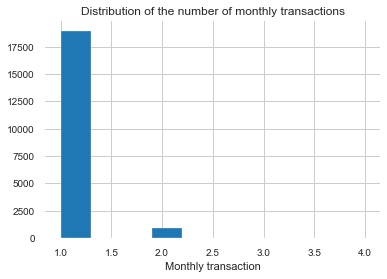

In [29]:
transactions_df_analysis.groupby(['cust_id','month_year'])['transaction_id'].count().hist()
plt.title('Distribution of the number of monthly transactions')
plt.xlabel('Monthly transaction')
#plt.ylabel('Count of customer-month pairs')
plt.show()

In most cases, users make no more than one transaction in one month

**Since users make only one transaction a month,how many months did a user make at least one transaction in our 3 years history?**


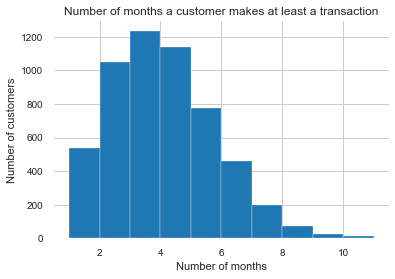

In [30]:
transactions_df_analysis.groupby('cust_id')['month_year'].nunique().hist()
plt.title('Number of months a customer makes at least a transaction')
plt.xlabel('Number of months')
plt.ylabel('Number of customers')
plt.show()

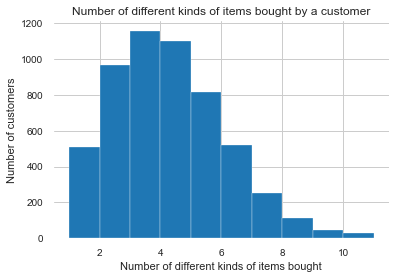

In [31]:
transactions_df.cust_id.value_counts().hist()
plt.title('Number of different kinds of items bought by a customer')
plt.xlabel('Number of different kinds of items bought')
plt.ylabel('Number of customers')
plt.show()

**Do customers buy the same item twice?**


In [32]:
customer_total_purchases = transactions_df.groupby('cust_id')[['item_id']].count().rename(columns={'item_id':'n_transactions'}).join(
    
    transactions_df.groupby('cust_id')[['item_id']].nunique().rename(columns={'item_id':'n_unique_items'})
)
customer_total_purchases['are_unique'] = (customer_total_purchases.n_transactions==customer_total_purchases.n_unique_items)
customer_total_purchases


,n_transactions,n_unique_items,are_unique
cust_id,,,
266783,4,3,False
266784,3,3,True
266785,7,5,False
266788,4,4,True
266794,11,8,False
...,...,...,...
275257,4,4,True
275261,3,3,True
275262,2,2,True


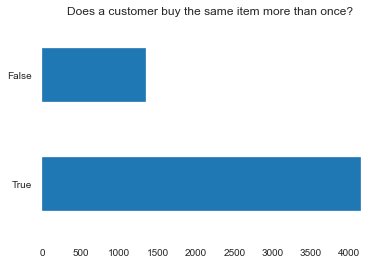

In [33]:
customer_total_purchases.are_unique.value_counts().plot.barh()
plt.title('Does a customer buy the same item more than once?')
plt.show()